In [1]:
import json
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import hdf5storage as h5
from matplotlib_scalebar.scalebar import ScaleBar,SI_LENGTH_RECIPROCAL
from ncempy import io as emio
import stemtool as st
%matplotlib inline
plt.rcParams['image.cmap'] = 'magma'
plt.rcParams.update({'font.size': 25})
plt.rcParams.update({'font.weight': 'bold'})

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import warnings
warnings.filterwarnings('ignore')

Load the images from the dm3 stack

In [4]:
image_dm3 = emio.dm.dmReader('/Users/7dm/Desktop/Yu Chuan Images/5eV_selenized WS2_190125_100kV_2-8nm-3D Stack.dm3')
adf_image_stack = image_dm3['data']

As we see there are 10 images in the stack, and we can plot them individually

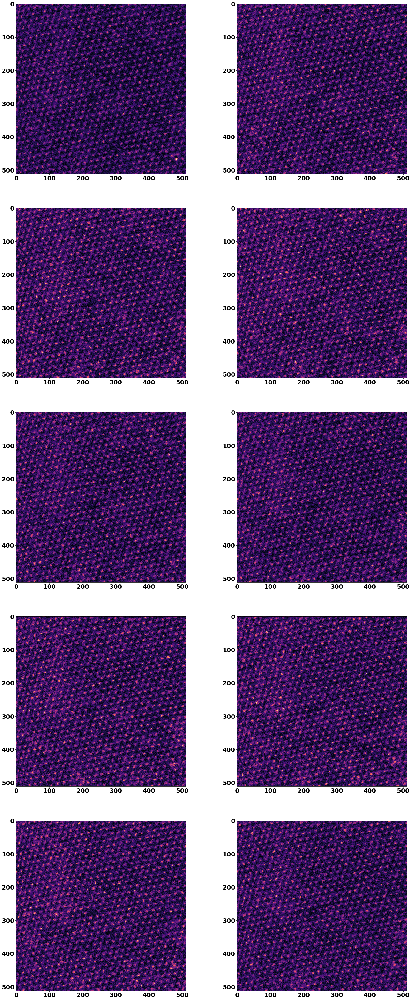

In [5]:
plt.figure(figsize=(30,75))
for ii in range(adf_image_stack.shape[0]):
    plt.subplot(5,2,ii+1)
    plt.imshow(adf_image_stack[ii,:,:])

To correct for the scan drift between the images, we load them into `multi_image_drift` class in the `afit` module of `stemtool`. This corrects for scan drift by cross-correlating all possible image pairs and then figuring out the relative shifts

In [6]:
st.tic()
drift_corr = st.afit.multi_image_drift(adf_image_stack)
drift_corr.get_shape_stack()
corrected = drift_corr.corrected_stack()
st.toc()

Elapsed time: 17.472915 seconds.



The left image is the result obtained from drift-correction, while the right image is from just summing up the image stack. As we observe there is significant drift, which `multi_image_drift` succesfully corrects, while also improving the signal-to-noise levels.

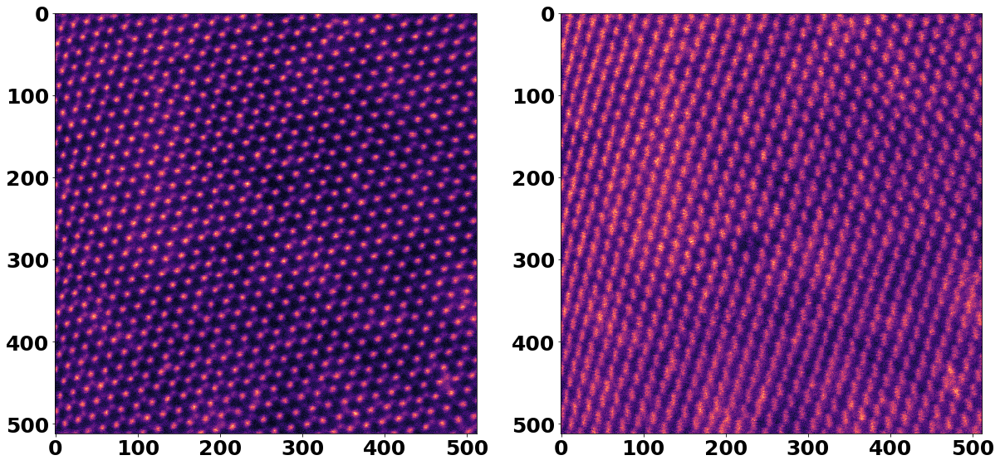

In [7]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(corrected)
plt.subplot(1,2,2)
plt.imshow(np.sum(adf_image_stack,axis=0))

`multi_image_drift` also comes with a method to plot the relative image shifts. As we observe the shifts are predominantly along the X direction.

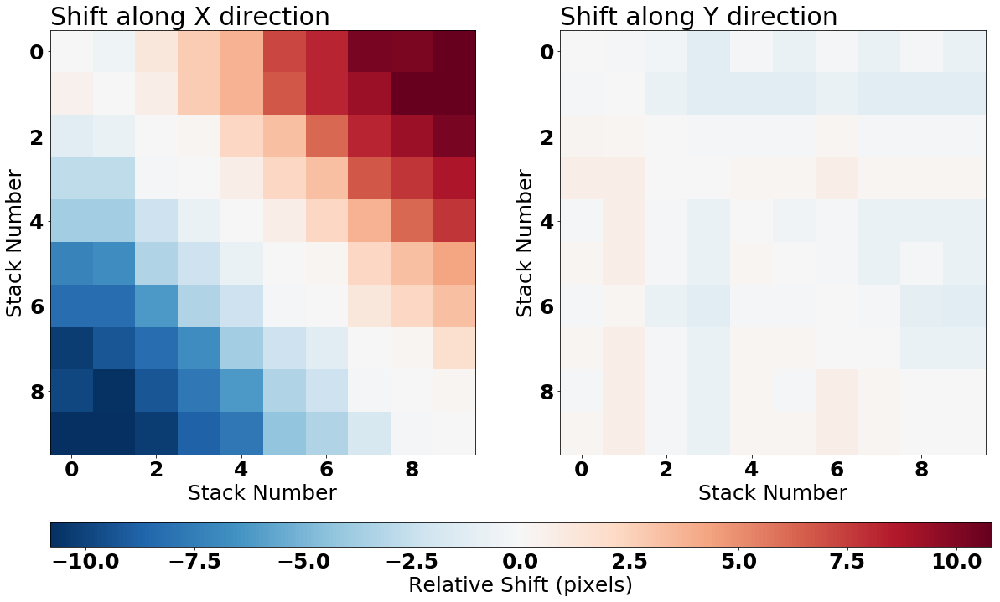

In [8]:
drift_corr.plot_shifts()